# Instal extension Kaggle

In [1]:
! pip install -q kaggle

In [2]:
from google.colab import files

**Upload Credential Account Kaggle**

In [3]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"dhayat","key":"14b4f1ee8dc2fe06a1e55391c89d54f8"}'}

In [4]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

**Download Datasets Dari Kaggle**

In [5]:
! kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

100% 5.20G/5.20G [01:48<00:00, 42.1MB/s]
100% 5.20G/5.20G [01:49<00:00, 51.2MB/s]


In [6]:
! mkdir skin_cancer

In [7]:
! unzip skin-cancer-mnist-ham10000.zip -d skin_cancer

Streaming output truncated to the last 5000 lines.
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029326.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029327.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029328.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029329.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029330.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029331.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029332.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029333.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029334.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029335.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029336.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029337.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029338.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029339.jpg  
  inflating

In [8]:
!rm -r /content/skin_cancer/ham10000_images_part_1
!rm -r /content/skin_cancer/ham10000_images_part_2

# Library

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools

import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
from keras.layers.normalization import BatchNormalization
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras.optimizers import Adam, SGD
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split

In [10]:
#1. Function to plot model's validation loss and validation accuracy
def plot_model_history(model_history):
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    # history for accuracy
    axs[0].plot(range(1,len(model_history.history['accuracy'])+1),model_history.history['accuracy'])
    axs[0].plot(range(1,len(model_history.history['val_accuracy'])+1),model_history.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1,len(model_history.history['accuracy'])+1),len(model_history.history['accuracy'])/10)
    axs[0].legend(['train', 'val'], loc='best')
    # history for loss
    axs[1].plot(range(1,len(model_history.history['loss'])+1),model_history.history['loss'])
    axs[1].plot(range(1,len(model_history.history['val_loss'])+1),model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1,len(model_history.history['loss'])+1),len(model_history.history['loss'])/10)
    axs[1].legend(['train', 'val'], loc='best')
    plt.show()

# Load Image dari Directory

In [11]:
dataset_dir = os.path.join('..', '/content/skin_cancer')

# Merging images from both folders HAM10000_images_part1.zip and HAM10000_images_part2.zip into one dictionary

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(dataset_dir, '*', '*.jpg'))}

# This dictionary is useful for displaying more human-friendly labels later on

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [12]:
skin_df = pd.read_csv(os.path.join(dataset_dir, 'HAM10000_metadata.csv'))

# Creating New Columns for better readability

skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes
# Now lets see the sample of tile_df to look on newly made columns
print(skin_df.head())

     lesion_id      image_id  ...                      cell_type cell_type_idx
0  HAM_0000118  ISIC_0027419  ...  Benign keratosis-like lesions             2
1  HAM_0000118  ISIC_0025030  ...  Benign keratosis-like lesions             2
2  HAM_0002730  ISIC_0026769  ...  Benign keratosis-like lesions             2
3  HAM_0002730  ISIC_0025661  ...  Benign keratosis-like lesions             2
4  HAM_0001466  ISIC_0031633  ...  Benign keratosis-like lesions             2

[5 rows x 10 columns]


## Data Cleaning & EDA

In [13]:
skin_df.isnull().sum()

lesion_id         0
image_id          0
dx                0
dx_type           0
age              57
sex               0
localization      0
path              0
cell_type         0
cell_type_idx     0
dtype: int64

In [14]:
skin_df['age'].fillna((skin_df['age'].mean()), inplace=True)

In [15]:
skin_df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age              0
sex              0
localization     0
path             0
cell_type        0
cell_type_idx    0
dtype: int64

In [16]:
skin_df.dtypes

lesion_id         object
image_id          object
dx                object
dx_type           object
age              float64
sex               object
localization      object
path              object
cell_type         object
cell_type_idx       int8
dtype: object

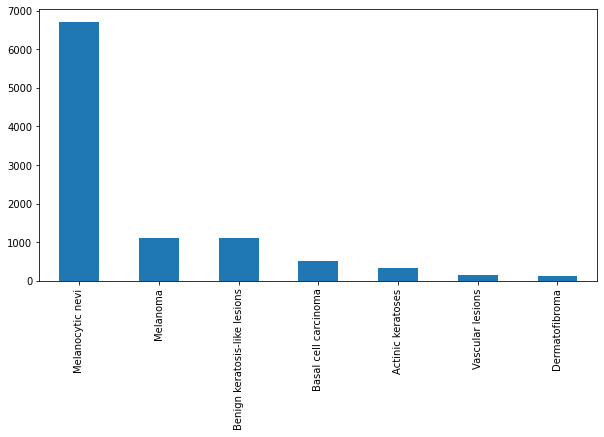

In [17]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_df['cell_type'].value_counts().plot(kind='bar', ax=ax1)


In [18]:
skin_df['cell_type_idx'].value_counts()

4    6705
5    1113
2    1099
1     514
0     327
6     142
3     115
Name: cell_type_idx, dtype: int64

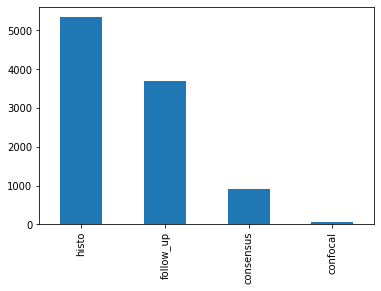

In [19]:
skin_df['dx_type'].value_counts().plot(kind='bar')

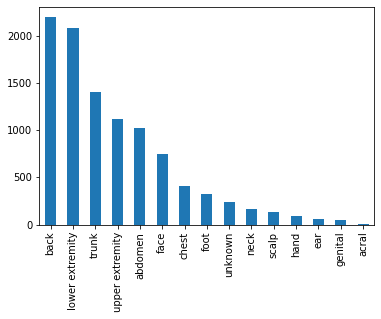

In [20]:
skin_df['localization'].value_counts().plot(kind='bar')

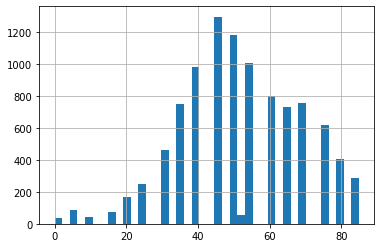

In [21]:
skin_df['age'].hist(bins=40)

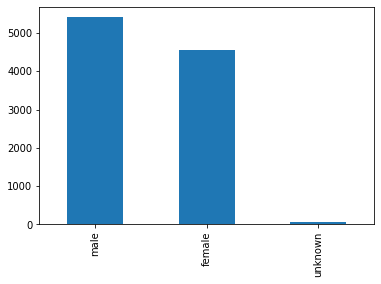

In [22]:
skin_df['sex'].value_counts().plot(kind='bar')

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


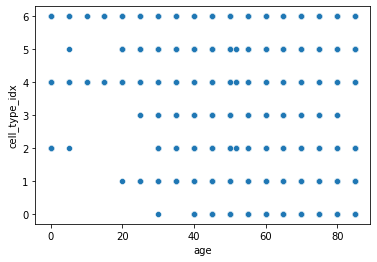

In [23]:
sns.scatterplot('age','cell_type_idx',data=skin_df)

In [24]:
skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))

In [25]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx,image
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[190, 153, 194], [192, 154, 196], [191, 153,..."
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[23, 13, 22], [24, 14, 24], [25, 14, 28], [3..."
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[185, 127, 137], [189, 133, 147], [194, 136,..."
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[24, 11, 17], [26, 13, 22], [38, 21, 32], [5..."
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/content/skin_cancer/HAM10000_images_part_2/IS...,Benign keratosis-like lesions,2,"[[[134, 90, 113], [147, 102, 125], [159, 115, ..."


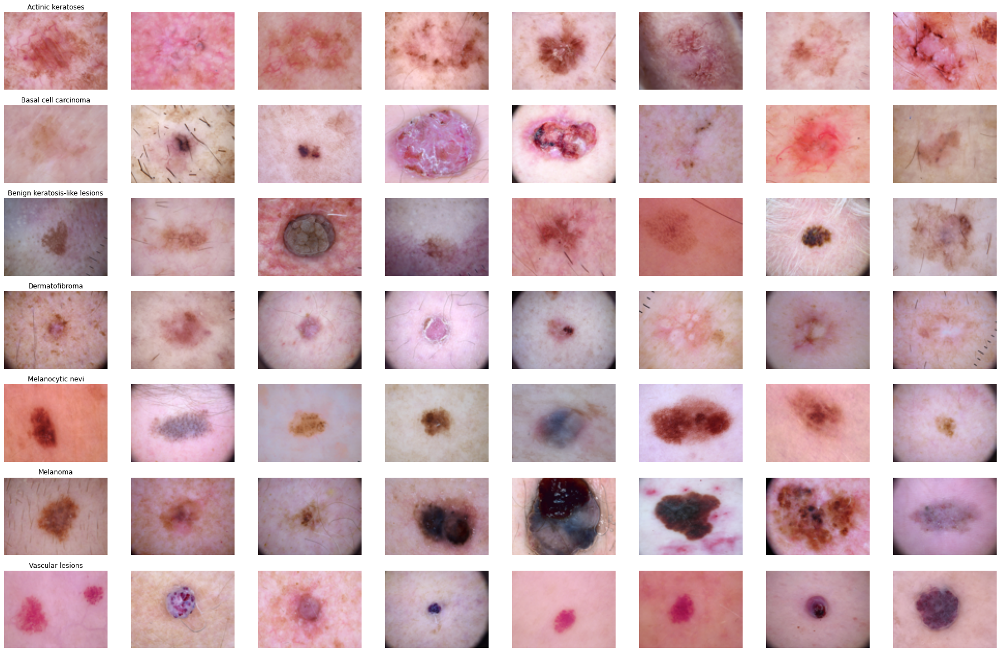

In [26]:
n_samples = 8
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

In [27]:
# Checking the image size distribution
skin_df['image'].map(lambda x: x.shape).value_counts()

(75, 100, 3)    10015
Name: image, dtype: int64

# Feature Engineering

## Train Test Split

In [28]:
features=skin_df.drop(columns=['cell_type_idx'],axis=1)
target=skin_df['cell_type_idx']

In [29]:
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(features, target, test_size=0.20,random_state=1234)

## Normalisasi

In [30]:
x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

## One Hot Encoding

In [31]:
# Perform one-hot encoding on the labels
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

## Train & Validation Data Split

In [32]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size = 0.2, random_state = 2)

In [33]:
# Reshape image in 3 dimensions (height = 75px, width = 100px , canal = 3)
x_train = x_train.reshape(x_train.shape[0], *(75, 100, 3))
x_test = x_test.reshape(x_test.shape[0], *(75, 100, 3))
x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

# Model CNN

In [34]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',padding = 'Same',input_shape=(75, 100, 3)))
model.add(Conv2D(32,kernel_size=(3, 3), activation='relu',padding = 'Same',))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.40))

model.add(Conv2D(128, (3, 3), activation='relu',padding = 'Same'))
model.add(Conv2D(128, (3, 3), activation='relu',padding = 'Same'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.50))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(7, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 75, 100, 32)       896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 75, 100, 32)       9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 37, 50, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 37, 50, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 37, 50, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 37, 50, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 18, 25, 64)        0

In [35]:
#OPTIMIZER
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
# optimizer = SGD(lr=0.001, momentum=0.9)

In [36]:
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

In [37]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

In [38]:
# AUGMENTATION

datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [39]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot

# Menampilkan Hasil Data Augmentation

Random Horizontal Shift


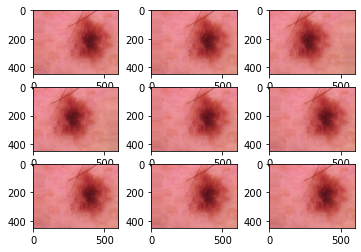

Random Vertical Shift


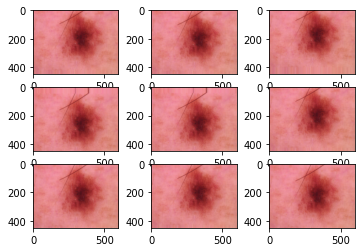

Random horizontal Flip


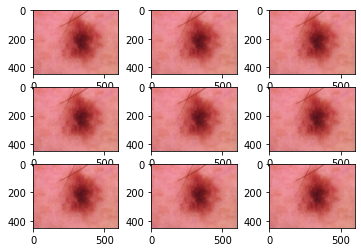

Random Rotation Augmentation


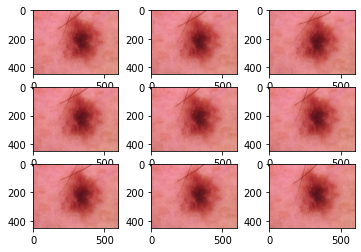

Random Zoom Augmentation


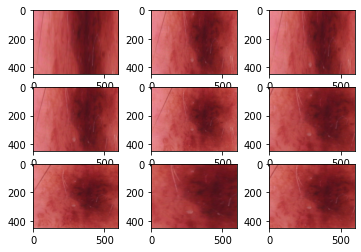

In [40]:
def parameter(prm):
  img = load_img('/content/skin_cancer/HAM10000_images_part_1/ISIC_0024306.jpg')
  data = img_to_array(img)
  samples = expand_dims(data, 0)
  datagen2 = (prm)
  it = datagen2.flow(samples, batch_size=1)
  for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
  pyplot.show()
param=[ImageDataGenerator(width_shift_range=[0.1]),ImageDataGenerator(height_shift_range=0.1),ImageDataGenerator(horizontal_flip=False),ImageDataGenerator(rotation_range=10),ImageDataGenerator(zoom_range=[0.1,0.5])]
name=['Random Horizontal Shift','Random Vertical Shift','Random horizontal Flip','Random Rotation Augmentation','Random Zoom Augmentation']

for i in range(len(name)):
  print(name[i])
  parameter(param[i])

# Set Checkpoint

In [41]:
from tensorflow.keras.callbacks import ModelCheckpoint

In [42]:
filepath='skincancer.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

In [43]:
from tensorflow.keras.callbacks import TensorBoard
import os
import datetime

# Set Tensorboard

In [44]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Tempat dimana log tensorboard akan di
callbacks_list.append(TensorBoard(logdir, histogram_freq=1))

# Running Model

In [45]:
# Fit the model
epochs = 100 
batch_size = 128
history = model.fit_generator(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size
                              , callbacks=callbacks_list)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/100
 1/50 [..............................] - ETA: 0s - loss: 1.8515 - accuracy: 0.2891WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
50/50 [==============================] - ETA: 0s - loss: 1.2332 - accuracy: 0.6415
Epoch 00001: val_accuracy improved from -inf to 0.67686, saving model to skincancer.h5
50/50 [==============================] - 14s 273ms/step - loss: 1.2332 - accuracy: 0.6415 - val_loss: 1.2400 - val_accuracy: 0.6769
Epoch 2/100
50/50 [==============================] - ETA: 0s - loss: 0.9989 - accuracy: 0.6693
Epoch 00002: val_accuracy improved from 0.67686 to 0.67873, saving model to skincancer.h5
50/50 [==============================] - 13s 261ms/step - loss: 0

# Saving Model & Evaluasi

In [46]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
loss_v, accuracy_v = model.evaluate(x_validate, y_validate, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))
model.save("model.h5")

51/51 [==============================] - 0s 7ms/step - loss: 0.7318 - accuracy: 0.7810
Validation: accuracy = 0.781036  ;  loss_v = 0.731803
Test: accuracy = 0.769845  ;  loss = 0.675480


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


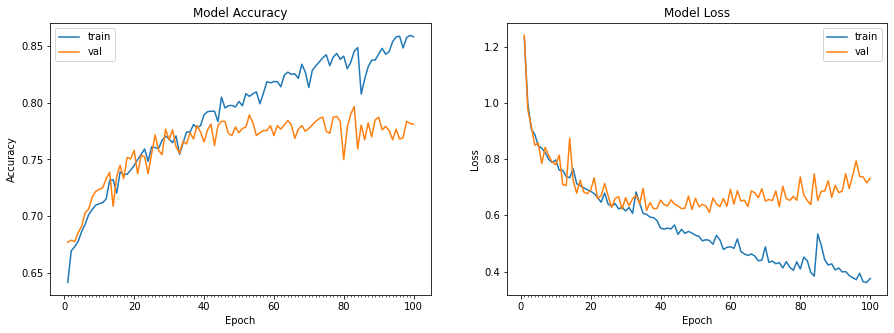

In [47]:
plot_model_history(history)

# Tampilan Tensorboard

In [48]:
%load_ext tensorboard

In [49]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [50]:
model_filename = "model.h5"

model.load_weights(model_filename)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Menampilkan Data yang terbaca pada Neuron per layer

In [51]:
from keras.models import Model
layer_outputs = [layer.output for layer in model.layers]
activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(x_train[10].reshape(1,75,100,3))
 
def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    activation_index=0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*2.5,col_size*1.5))
    for row in range(0,row_size):
        for col in range(0,col_size):
            ax[row][col].imshow(activation[0, :, :, activation_index], cmap=None)
            activation_index += 1
        


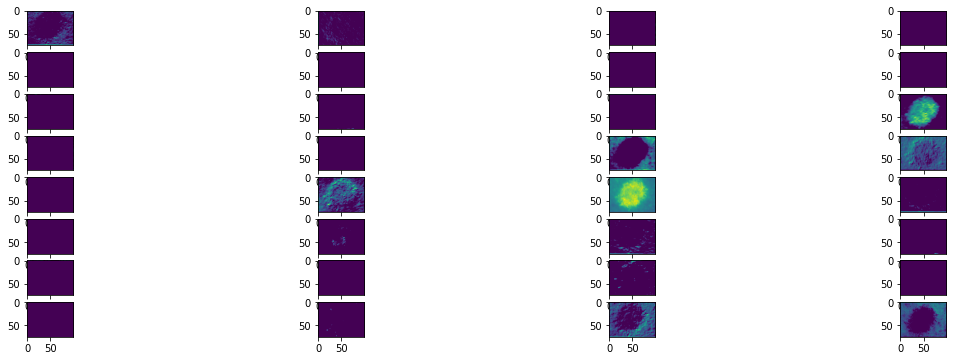

In [52]:
#conv2d pertama
display_activation(activations, 4, 8, 0)

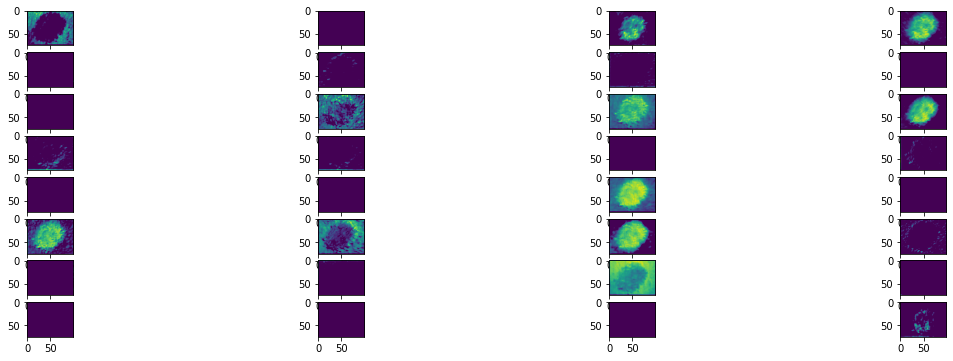

In [53]:
#Conv2d kedua
display_activation(activations, 4, 8, 1)

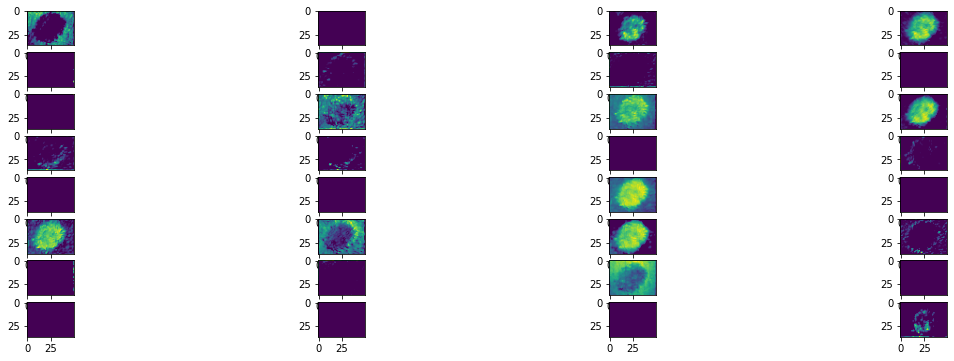

In [54]:
#Max Pooling pertama
display_activation(activations, 4, 8, 2)

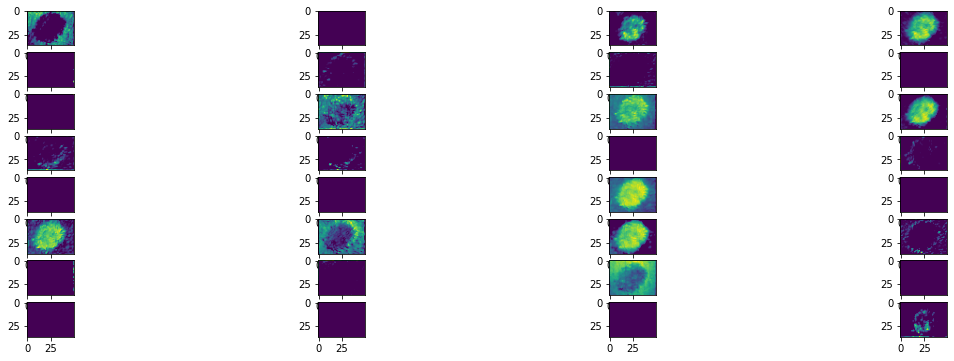

In [55]:
#DropOut pertama
display_activation(activations, 4, 8, 3)

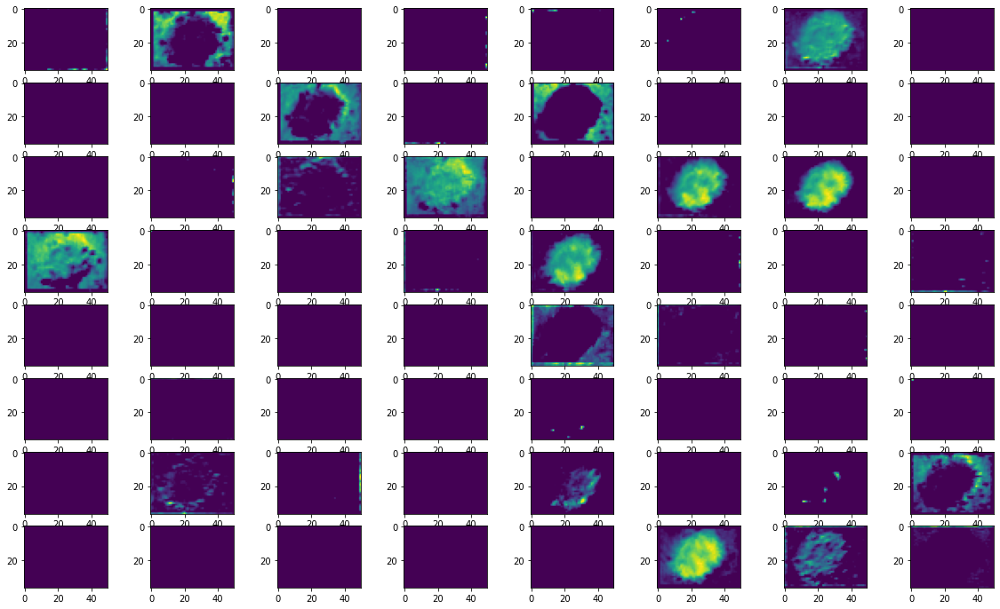

In [56]:
#Conv2d ketiga
display_activation(activations, 8, 8, 4)

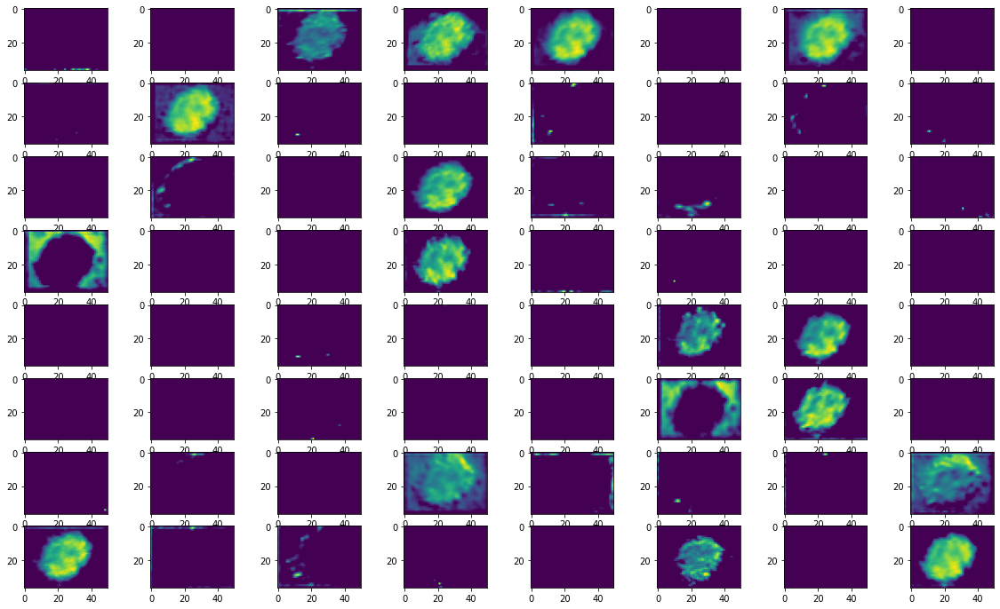

In [57]:
#conv2d keempat
display_activation(activations, 8, 8, 5)

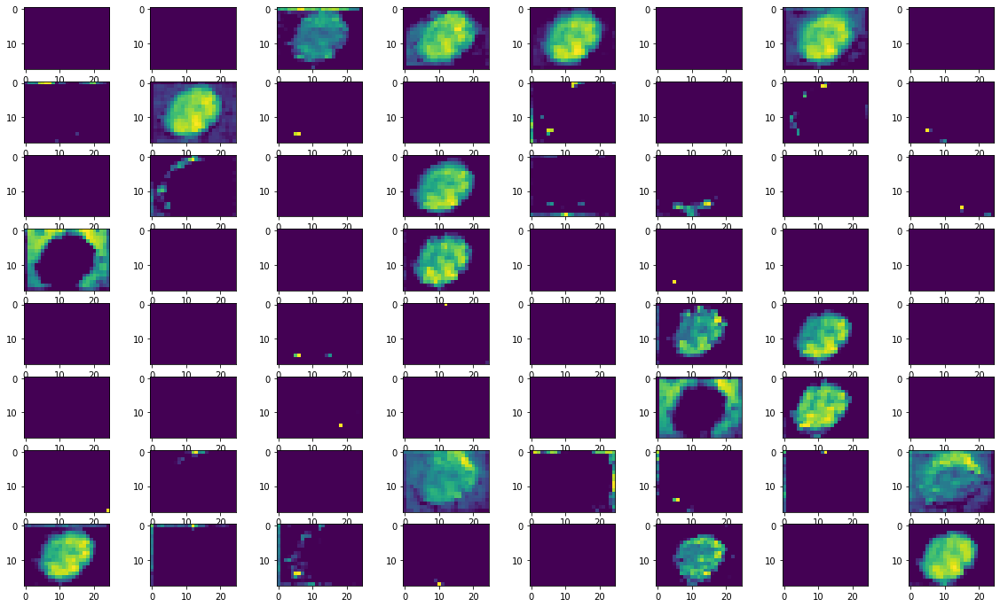

In [58]:
#Max Pooling kedua
display_activation(activations, 8, 8, 6)

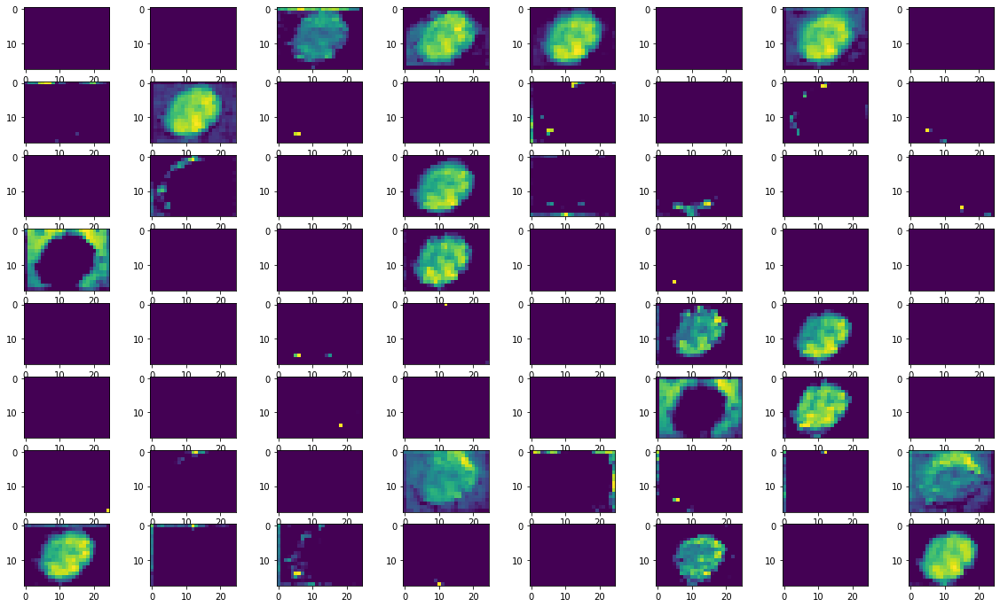

In [59]:
#DropOut kedua
display_activation(activations, 8, 8, 7)

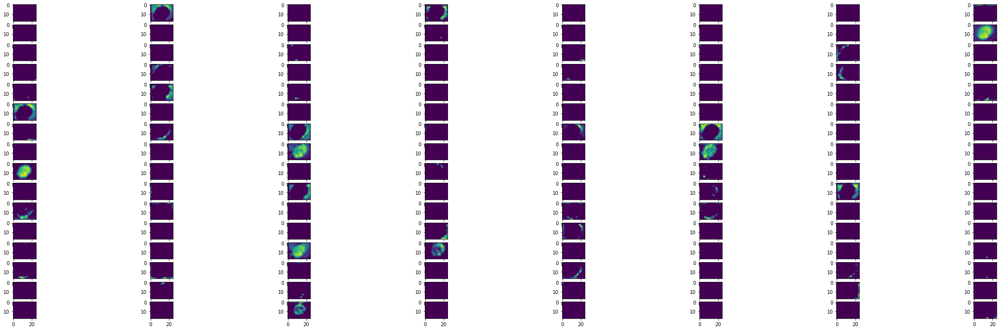

In [60]:
#conv2d kelima
display_activation(activations, 8, 16, 8)

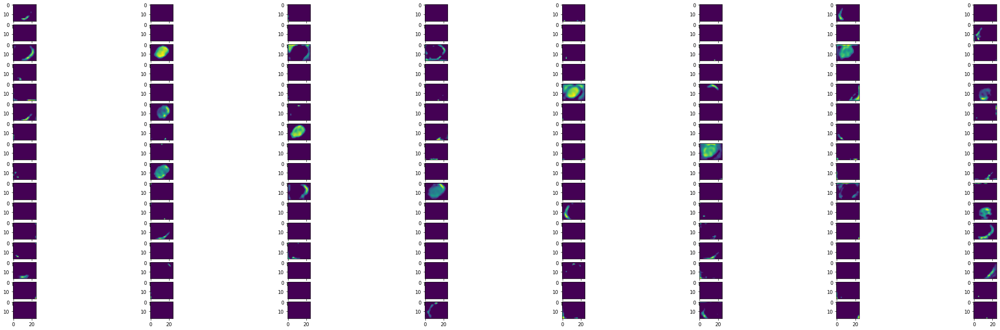

In [61]:
#conv2d keenam
display_activation(activations, 8, 16, 9)

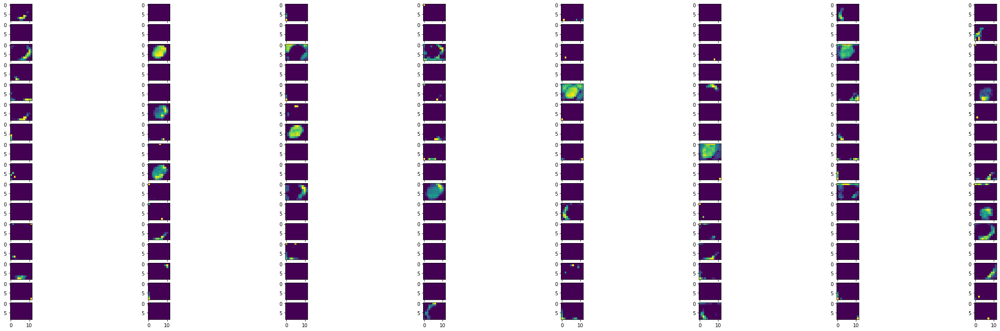

In [62]:
#Max Pooling ketiga
display_activation(activations, 8, 16, 10)

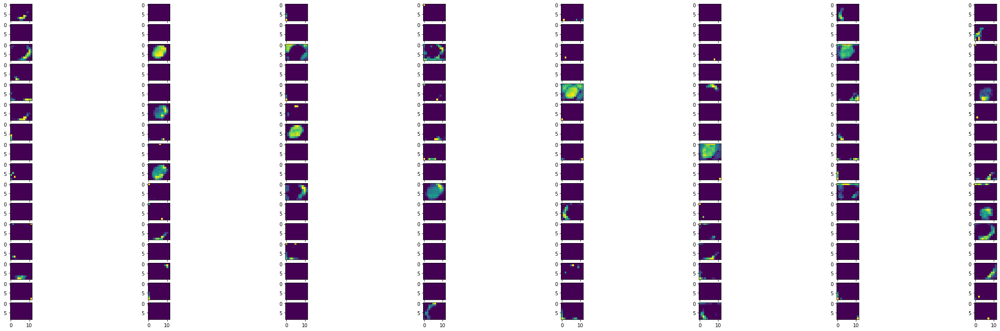

In [63]:
#DropOut ketiga
display_activation(activations, 8, 16, 11)

# Confusion Matrix

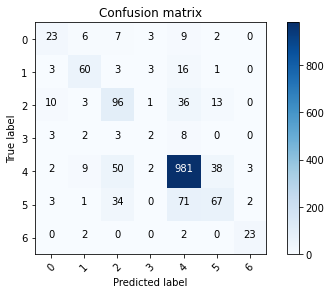

In [64]:
# Function to plot confusion matrix    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_validate)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(y_validate,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)

 

# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(7)) 

Text(0, 0.5, 'Fraction classified incorrectly')

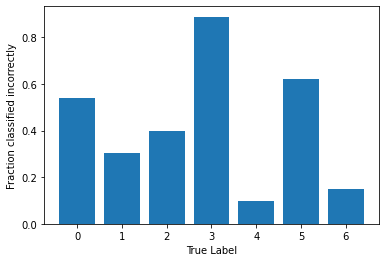

In [65]:
label_frac_error = 1 - np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)
plt.bar(np.arange(7),label_frac_error)
plt.xlabel('True Label')
plt.ylabel('Fraction classified incorrectly')

In [66]:
predictions = model.predict(x_validate)
predictions

array([[8.1590919e-13, 1.9108364e-10, 1.4751345e-08, ..., 9.9999940e-01,
        5.8231780e-07, 5.0551880e-13],
       [5.2082509e-08, 1.1103414e-05, 4.9877586e-04, ..., 9.9948764e-01,
        2.3889111e-06, 1.9229269e-09],
       [7.8991875e-02, 8.1901789e-01, 8.5824477e-03, ..., 8.4444312e-03,
        3.2466947e-04, 6.6593932e-03],
       ...,
       [1.3041377e-12, 6.4455885e-17, 3.2186244e-06, ..., 8.6704820e-01,
        1.3294865e-01, 1.6426249e-11],
       [2.4110997e-05, 1.1052702e-05, 9.2076048e-02, ..., 7.6145130e-01,
        1.4598742e-01, 5.5505502e-06],
       [3.8809024e-14, 1.4032566e-12, 5.4401532e-11, ..., 9.9999952e-01,
        4.9002847e-07, 4.3717673e-12]], dtype=float32)

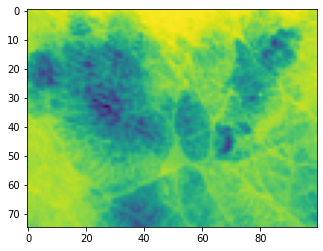

In [67]:
plt.imshow(x_validate[1500][:,:,0]);

In [68]:
result = np.argmax(predictions[1500])
if result == 0:
  print ('Actinic keratoses')
elif result == 1:
  print ('Basal cell carcinoma')
elif result == 2:
  print ('Benign keratosis-like lesions')
elif result == 3:
  print ('Dermatofibroma')
elif result == 4:
  print ('Melanocytic nevi')
elif result == 5:
  print ('Melanoma')
elif result == 6:
  print ('Vascular lesions')


Actinic keratoses


In [69]:
import cv2 as cv

In [70]:
image = cv.imread('/content/skin_cancer/HAM10000_images_part_2/ISIC_0029322.jpg')

image = cv.resize(image, (100,75))
# image = image.astype('float32')
image_mean = np.mean(image)
image_std = np.std(image)

img_test = (image - image_mean)/image_std

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


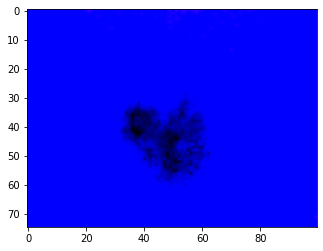

In [71]:
# image.shape
plt.imshow(img_test)

In [72]:
img_test.shape

(75, 100, 3)

In [73]:
img_test = img_test.reshape((1, 75, 100, 3))

In [74]:
predictions = model.predict(img_test)
predictions

array([[3.6555933e-10, 9.9741387e-01, 1.4994541e-14, 1.1064394e-23,
        2.5861484e-03, 5.4301161e-14, 2.1272661e-15]], dtype=float32)

In [75]:
result = np.argmax(predictions[0])
if result == 0:
  print ('Actinic keratoses')
elif result == 1:
  print ('Basal cell carcinoma')
elif result == 2:
  print ('Benign keratosis-like lesions')
elif result == 3:
  print ('Dermatofibroma')
elif result == 4:
  print ('Melanocytic nevi')
elif result == 5:
  print ('Melanoma')
elif result == 6:
  print ('Vascular lesions')

Basal cell carcinoma


# NGrok Flask Test

In [76]:
#install flask-ngrok menggunakan pip
!pip install flask-ngrok

In [77]:
from flask_ngrok import run_with_ngrok
from flask import Flask
from flask import jsonify, request
from werkzeug.utils import secure_filename
import requests
import json
import cv2 as cv

In [91]:
app = Flask(__name__) # Membuat sebuah object Flask
upload_folder = '/content/' #directory tempat penyimpanan gambar yang akan di prediksi
app.config['upload_folder'] = upload_folder

#homepage 
@app.route("/home")
def home(): 
    html="""<html>
    <body>

    <form action="/classify" method="post" enctype="multipart/form-data">
    Pilih Gambar yang akan diprediksi: 
    <input type="file" name="fileToUpload" id="fileToUpload">
    <input type="submit" value="Upload Gambar" name="submit">
    </form>
    </body>
    </html>"""

    return html

In [92]:
@app.route('/classify', methods=['POST'])
def classification():
  file = request.files['fileToUpload']
  if file:
    filename = secure_filename(file.filename)
    file.save(os.path.join(app.config['upload_folder'], filename))

  image = cv.imread(upload_folder+filename) #baca data gambar yang di upload
  image = cv.resize(image, (100,75))
  # image = image.astype('float32')
  image_mean = np.mean(image)
  image_std = np.std(image)

  image_test = (image - image_mean)/image_std
  image = image.reshape((1, 75, 100, 3)) #data gambar di reshape menjadi ukuran 75x100 pixel dan berdimensi 3

  model.load_weights('/content/skincancer.h5') #load weights terbaik dari model yang telah kita simpan sebelumnya
  model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy']) #model dijalankan dengan parameter tersebut

  predictions = model.predict(image) #proses prediksi terhadap gambar yang kita upload
  result = np.argmax(predictions[0]).tolist()
  if result == 0:
    results = 'Actinic keratoses'
  elif result == 1:
    results = 'Basal cell carcinoma'
  elif result == 2:
    results = 'Benign keratosis-like lesions'
  elif result == 3:
    results = 'Dermatofibroma'
  elif result == 4:
    results = 'Melanocytic nevi'
  elif result == 5:
    results = 'Melanoma'
  elif result == 6:
    results = 'Vascular lesions'


  return jsonify({
      "hasil_prediksi": results
      })

In [93]:
#run app webservice yang dibuat menggunakan ngrok
run_with_ngrok(app) 

app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://0bfa8bf07683.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [18/Oct/2020 06:59:33] "GET / HTTP/1.1" 404 -
127.0.0.1 - - [18/Oct/2020 06:59:37] "GET /home HTTP/1.1" 200 -
127.0.0.1 - - [18/Oct/2020 06:59:38] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [18/Oct/2020 06:59:44] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [18/Oct/2020 06:59:52] "POST /classify HTTP/1.1" 200 -


# Streamlit Test

In [ ]:
image = cv.imread(upload_folder+filename) #baca data gambar yang di upload
image = cv.resize(image, (100,75))
# image = image.astype('float32')
image_mean = np.mean(image)
image_std = np.std(image)

image_test = (image - image_mean)/image_std
image = image.reshape((1, 75, 100, 3)) #data gambar di reshape menjadi ukuran 75x100 pixel dan berdimensi 3

model.load_weights('/content/skincancer.h5') #load weights terbaik dari model yang telah kita simpan sebelumnya
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy']) #model dijalankan dengan parameter tersebut

predictions = model.predict(image) #proses prediksi terhadap gambar yang kita upload
result = np.argmax(predictions[0]).tolist()